In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold

In [2]:

file_path = '/Users/smashallah/train_data.csv'
df = pd.read_csv(file_path)

# Remove the 'id' column
df = df.drop(columns=['id'])

df


,home_team_abbr,away_team_abbr,date,is_night_game,home_team_win,home_pitcher,away_pitcher,home_team_rest,away_team_rest,home_pitcher_rest,...,away_pitcher_H_batters_faced_skew,away_pitcher_BB_batters_faced_mean,away_pitcher_BB_batters_faced_std,away_pitcher_BB_batters_faced_skew,away_pitcher_leverage_index_avg_mean,away_pitcher_leverage_index_avg_std,away_pitcher_leverage_index_avg_skew,away_pitcher_wpa_def_mean,away_pitcher_wpa_def_std,away_pitcher_wpa_def_skew
0,KFH,KJP,2021-05-16,False,True,juradar01,carraca01,1.0,1.0,15.0,...,1.133350,-0.974559,-0.900633,-1.093425,0.896974,-0.611051,-0.398111,0.949021,1.007072,0.340438
1,VJV,HXK,2019-05-04,True,False,ramirer02,rodrich01,2.0,NaN,9.0,...,-0.044641,-0.878649,-1.079528,-1.719608,0.050448,-0.851738,-0.202878,0.489511,-0.876286,1.416154
2,VJV,JEM,2019-06-10,True,True,jarvibr01,tropeni01,1.0,1.0,6.0,...,-0.100180,-1.702937,-0.867762,1.992552,-0.404961,-0.132717,-0.106344,2.481020,-0.200110,-0.026083
3,BPH,FBW,2018-06-26,True,True,diazyi01,johnsji04,1.0,1.0,5.0,...,-1.385079,-1.549095,-1.008470,0.116080,-1.236753,-0.119898,0.005985,1.646317,-0.764309,NaN
4,RLJ,DPS,2016-07-05,True,False,willibr02,armstsh01,1.0,1.0,6.0,...,0.356122,0.663967,-0.123547,0.361822,-0.035276,-0.285671,-2.563819,0.527432,-0.911987,-1.109533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11062,VQC,MOO,2016-07-08,True,True,lodolni01,danieda01,1.0,1.0,5.0,...,0.446414,0.498714,-0.016668,-0.360635,0.155712,0.054024,NaN,1.031686,0.045731,-0.175099
11063,GKO,VQC,2023-04-19,False,False,gearrco01,ginnjt01,1.0,1.0,5.0,...,0.714723,-0.473958,0.793842,1.039308,1.475612,-0.929588,-0.903482,1.208667,2.000674,-1.396761
11064,ECN,QPO,2022-05-27,True,True,avilape01,rodrije01,1.0,2.0,5.0,...,2.539210,0.307611,-1.203648,0.436108,-0.429071,-0.005314,0.091690,0.673315,-0.254586,-2.032732
11065,QDH,HXK,2021-05-19,True,False,alvarjo02,rodriya01,1.0,1.0,5.0,...,0.595529,-0.715971,0.515236,1.147914,-0.038848,-0.328605,0.058396,0.807748,NaN,1.090447


In [3]:
# Load the new test data (same_season_test_date.csv)
test_data = pd.read_csv('/Users/smashallah/same_season_test_data.csv')

# Check the first few rows to understand its structure
test_data


,id,home_team_abbr,away_team_abbr,is_night_game,home_pitcher,away_pitcher,home_team_rest,away_team_rest,home_pitcher_rest,away_pitcher_rest,...,away_pitcher_H_batters_faced_skew,away_pitcher_BB_batters_faced_mean,away_pitcher_BB_batters_faced_std,away_pitcher_BB_batters_faced_skew,away_pitcher_leverage_index_avg_mean,away_pitcher_leverage_index_avg_std,away_pitcher_leverage_index_avg_skew,away_pitcher_wpa_def_mean,away_pitcher_wpa_def_std,away_pitcher_wpa_def_skew
0,0,HXK,SAJ,False,henryto01,carraca01,1.0,1.0,5.0,5.0,...,1.897061,-0.021571,NaN,0.657736,-0.105414,-0.215965,-0.341056,0.710790,-0.305795,-1.103229
1,1,VJV,DPS,True,swanser01,biagijo01,1.0,1.0,6.0,5.0,...,-0.174718,0.206991,-0.365752,-0.660023,-0.166158,-0.400556,0.189584,-0.129330,0.467740,0.873353
2,2,BPH,KJP,True,richaly01,dowdyky01,2.0,2.0,7.0,6.0,...,2.960091,-0.027093,0.200172,NaN,-0.088088,1.423080,1.902420,-0.486104,0.380234,0.944937
3,3,GLO,PJT,False,butleed01,gonzagi01,1.0,1.0,5.0,5.0,...,-0.345691,-0.517786,-0.160474,0.970894,-0.028288,-0.272571,-0.366498,-0.583598,0.654581,NaN
4,4,PDF,HAN,False,thompza01,widenta01,1.0,1.0,NaN,6.0,...,0.948865,-0.248708,-0.401949,-0.229898,0.047862,-0.396524,-0.862731,-0.262628,0.444447,-0.113465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6180,6180,PJT,GLO,True,dunnida01,matusbr01,1.0,1.0,6.0,97.0,...,3.392216,2.512546,4.833286,0.604979,-1.372334,2.479468,NaN,-0.515166,-1.832176,-2.189157
6181,6181,RLJ,KJP,False,schrejo01,lopezjo02,1.0,1.0,6.0,6.0,...,1.209798,0.162013,1.156913,1.153948,-1.091520,0.352844,-1.393326,-0.849379,-1.228204,0.145295
6182,6182,VJV,DPS,True,kellyca01,faedoal01,1.0,1.0,6.0,5.0,...,0.174997,-0.045645,-0.540794,-0.196066,-0.073852,-0.194965,-0.755898,0.444184,0.262688,0.417515
6183,6183,KFH,FBW,False,waldike01,detmere01,1.0,1.0,5.0,5.0,...,-0.770237,-0.947281,-0.962909,-0.002763,0.198935,-0.014849,0.392745,0.690523,0.815152,-0.113742


In [4]:
# Identify numeric columns train data
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()


In [5]:
# Identify numeric columns test data
numeric_columns_test = test_data.select_dtypes(include=['float64', 'int64']).columns.tolist()
print(numeric_columns_test)

['id', 'home_team_rest', 'away_team_rest', 'home_pitcher_rest', 'away_pitcher_rest', 'season', 'home_batting_batting_avg_10RA', 'home_batting_onbase_perc_10RA', 'home_batting_onbase_plus_slugging_10RA', 'home_batting_leverage_index_avg_10RA', 'home_batting_RBI_10RA', 'away_batting_batting_avg_10RA', 'away_batting_onbase_perc_10RA', 'away_batting_onbase_plus_slugging_10RA', 'away_batting_leverage_index_avg_10RA', 'away_batting_RBI_10RA', 'home_pitching_earned_run_avg_10RA', 'home_pitching_SO_batters_faced_10RA', 'home_pitching_H_batters_faced_10RA', 'home_pitching_BB_batters_faced_10RA', 'away_pitching_earned_run_avg_10RA', 'away_pitching_SO_batters_faced_10RA', 'away_pitching_H_batters_faced_10RA', 'away_pitching_BB_batters_faced_10RA', 'home_pitcher_earned_run_avg_10RA', 'home_pitcher_SO_batters_faced_10RA', 'home_pitcher_H_batters_faced_10RA', 'home_pitcher_BB_batters_faced_10RA', 'away_pitcher_earned_run_avg_10RA', 'away_pitcher_SO_batters_faced_10RA', 'away_pitcher_H_batters_faced_

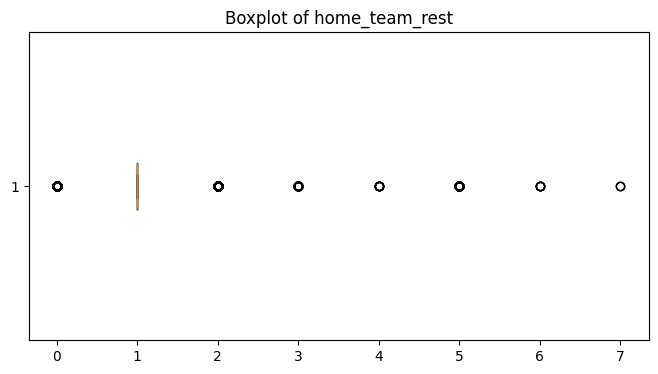

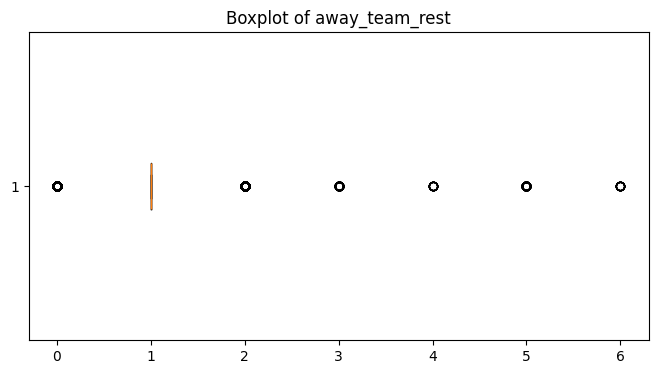

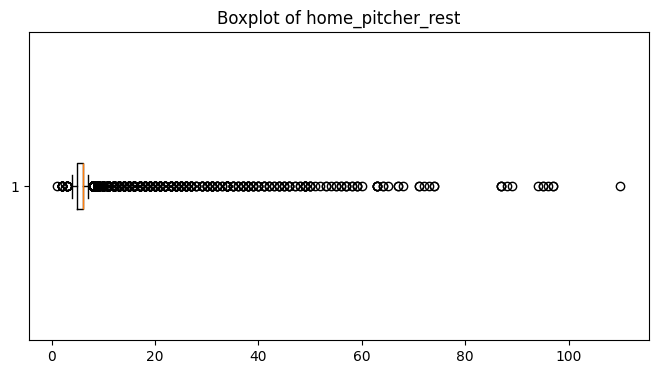

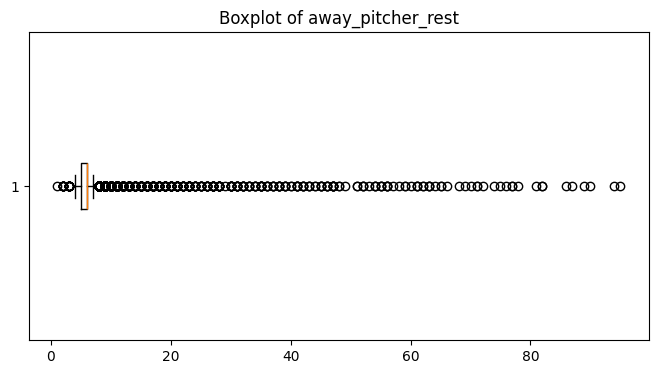

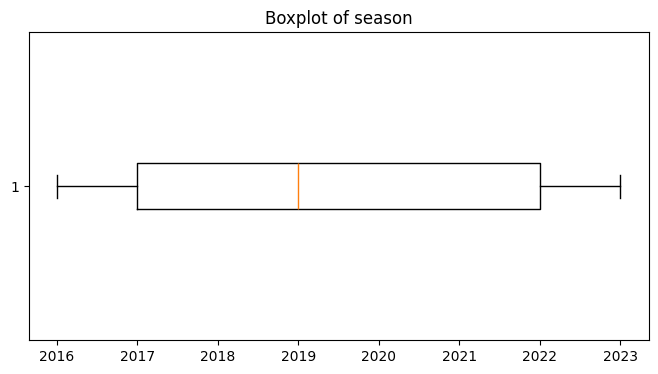

...

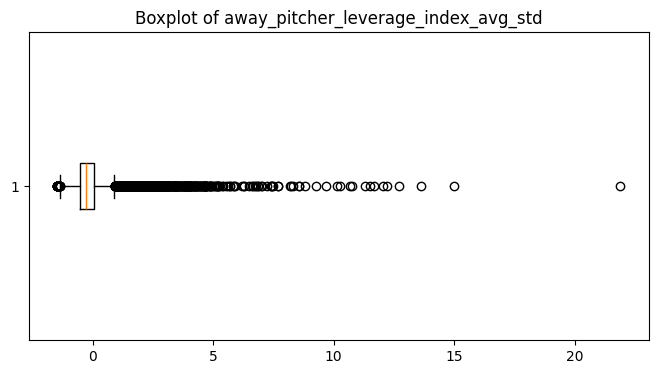

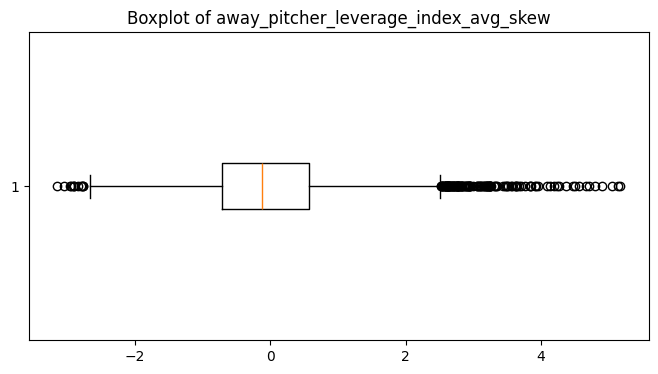

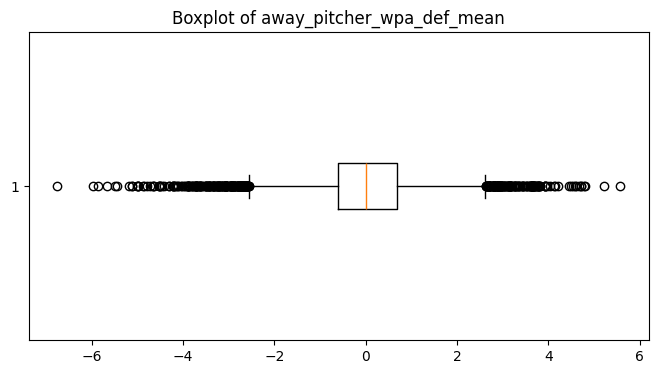

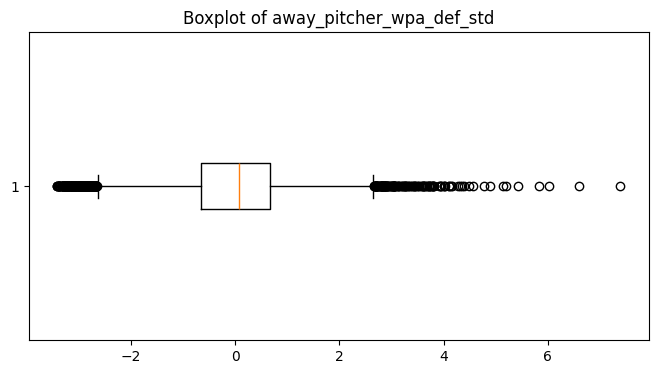

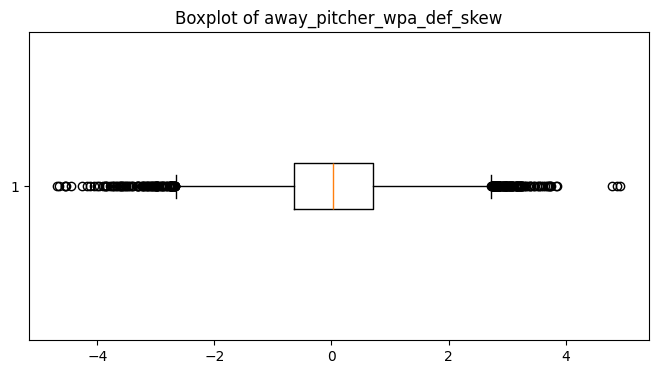

In [6]:

# Visualize outliers using a boxplot
for column in numeric_columns:
    plt.figure(figsize=(8, 4))
    plt.boxplot(df[column].dropna(), vert=False)
    plt.title(f"Boxplot of {column}")
    plt.show()

In [7]:

def handle_outliers_iqr(df, numeric_columns):
    for column in numeric_columns:
        # Calculate Q1, Q3, and IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define outlier boundaries
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Cap outliers to the boundaries
        df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
        df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    
    return df

# Select numeric columns
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Apply IQR handling to numeric columns
df_cleaned = handle_outliers_iqr(df, numeric_columns)

df_cleaned


,home_team_abbr,away_team_abbr,date,is_night_game,home_team_win,home_pitcher,away_pitcher,home_team_rest,away_team_rest,home_pitcher_rest,...,away_pitcher_H_batters_faced_skew,away_pitcher_BB_batters_faced_mean,away_pitcher_BB_batters_faced_std,away_pitcher_BB_batters_faced_skew,away_pitcher_leverage_index_avg_mean,away_pitcher_leverage_index_avg_std,away_pitcher_leverage_index_avg_skew,away_pitcher_wpa_def_mean,away_pitcher_wpa_def_std,away_pitcher_wpa_def_skew
0,KFH,KJP,2021-05-16,False,True,juradar01,carraca01,1.0,1.0,7.5,...,1.133350,-0.974559,-0.900633,-1.093425,0.896974,-0.611051,-0.398111,0.949021,1.007072,0.340438
1,VJV,HXK,2019-05-04,True,False,ramirer02,rodrich01,1.0,NaN,7.5,...,-0.044641,-0.878649,-1.079528,-1.719608,0.050448,-0.851738,-0.202878,0.489511,-0.876286,1.416154
2,VJV,JEM,2019-06-10,True,True,jarvibr01,tropeni01,1.0,1.0,6.0,...,-0.100180,-1.702937,-0.867762,1.992552,-0.404961,-0.132717,-0.106344,2.481020,-0.200110,-0.026083
3,BPH,FBW,2018-06-26,True,True,diazyi01,johnsji04,1.0,1.0,5.0,...,-1.385079,-1.549095,-1.008470,0.116080,-1.236753,-0.119898,0.005985,1.646317,-0.764309,NaN
4,RLJ,DPS,2016-07-05,True,False,willibr02,armstsh01,1.0,1.0,6.0,...,0.356122,0.663967,-0.123547,0.361822,-0.035276,-0.285671,-2.563819,0.527432,-0.911987,-1.109533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11062,VQC,MOO,2016-07-08,True,True,lodolni01,danieda01,1.0,1.0,5.0,...,0.446414,0.498714,-0.016668,-0.360635,0.155712,0.054024,NaN,1.031686,0.045731,-0.175099
11063,GKO,VQC,2023-04-19,False,False,gearrco01,ginnjt01,1.0,1.0,5.0,...,0.714723,-0.473958,0.793842,1.039308,1.475612,-0.929588,-0.903482,1.208667,2.000674,-1.396761
11064,ECN,QPO,2022-05-27,True,True,avilape01,rodrije01,1.0,1.0,5.0,...,2.539210,0.307611,-1.203648,0.436108,-0.429071,-0.005314,0.091690,0.673315,-0.254586,-2.032732
11065,QDH,HXK,2021-05-19,True,False,alvarjo02,rodriya01,1.0,1.0,5.0,...,0.595529,-0.715971,0.515236,1.147914,-0.038848,-0.328605,0.058396,0.807748,NaN,1.090447


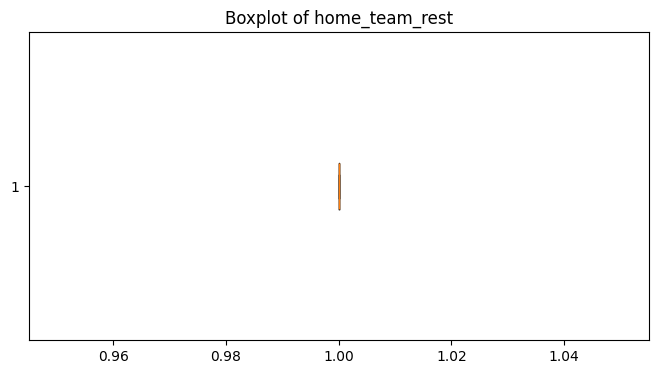

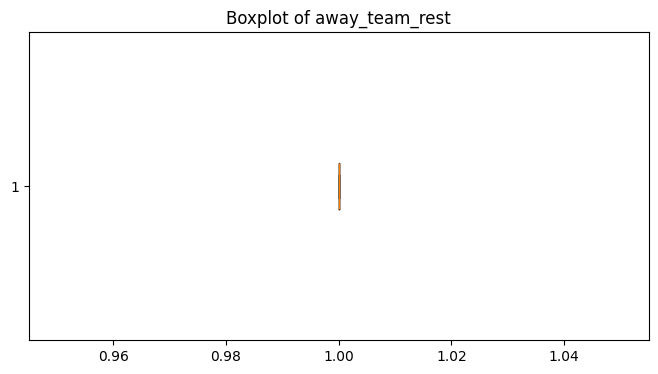

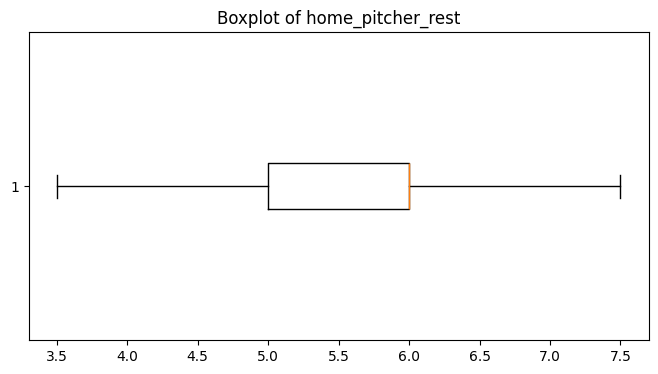

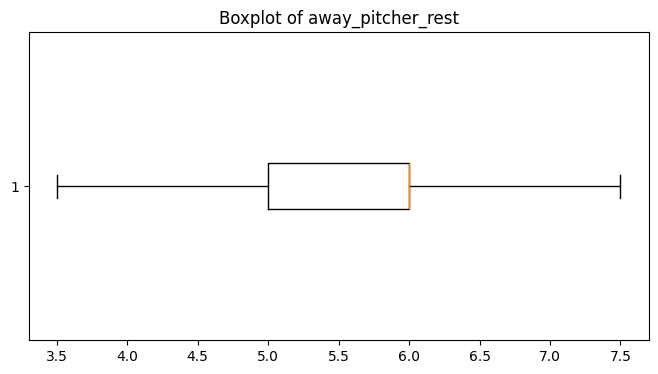

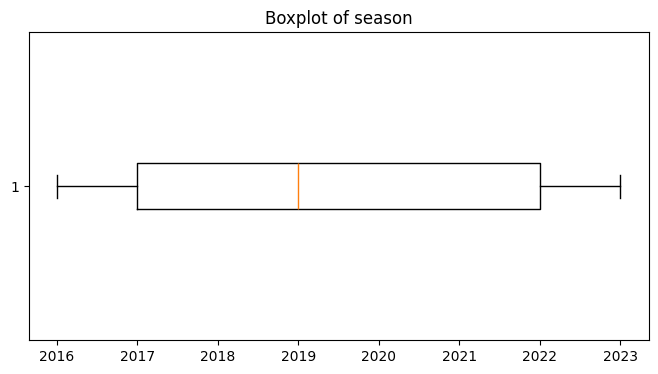

...

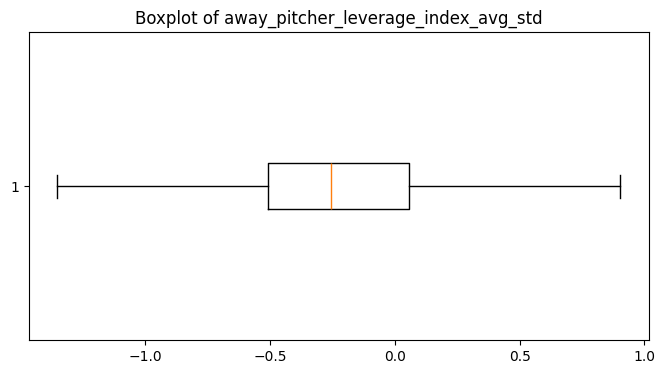

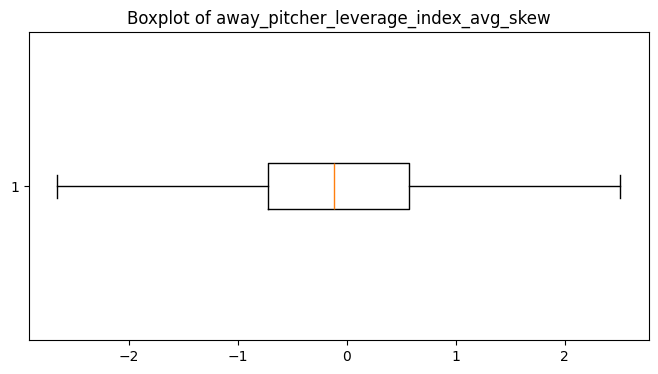

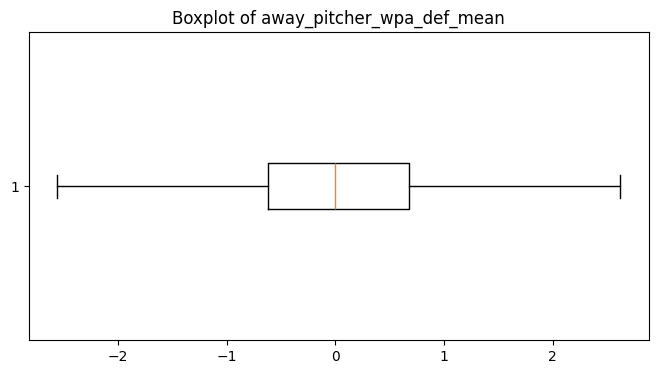

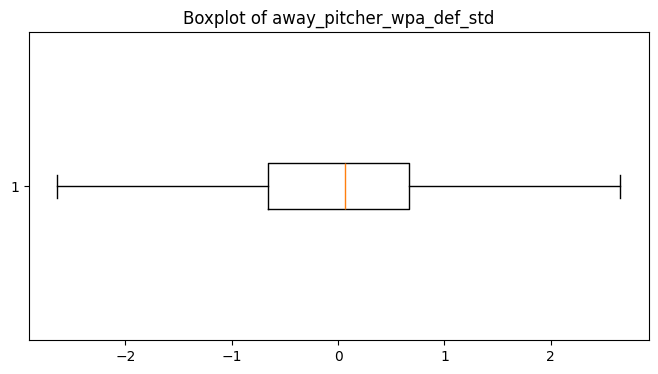

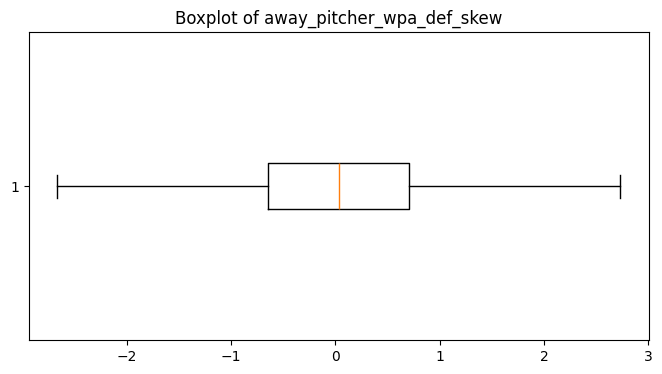

In [8]:

import matplotlib.pyplot as plt

# Visualize outliers using a boxplot
for column in numeric_columns:
    plt.figure(figsize=(8, 4))
    plt.boxplot(df_cleaned[column].dropna(), vert=False)
    plt.title(f"Boxplot of {column}")
    plt.show()

In [9]:

numeric_columns = df_cleaned.select_dtypes(include=[np.number]).columns
for column in numeric_columns:
    df_cleaned[column] = df_cleaned[column].fillna(df_cleaned[column].mean())

In [10]:
df_cleaned

,home_team_abbr,away_team_abbr,date,is_night_game,home_team_win,home_pitcher,away_pitcher,home_team_rest,away_team_rest,home_pitcher_rest,...,away_pitcher_H_batters_faced_skew,away_pitcher_BB_batters_faced_mean,away_pitcher_BB_batters_faced_std,away_pitcher_BB_batters_faced_skew,away_pitcher_leverage_index_avg_mean,away_pitcher_leverage_index_avg_std,away_pitcher_leverage_index_avg_skew,away_pitcher_wpa_def_mean,away_pitcher_wpa_def_std,away_pitcher_wpa_def_skew
0,KFH,KJP,2021-05-16,False,True,juradar01,carraca01,1.0,1.0,7.5,...,1.133350,-0.974559,-0.900633,-1.093425,0.896974,-0.611051,-0.398111,0.949021,1.007072,0.340438
1,VJV,HXK,2019-05-04,True,False,ramirer02,rodrich01,1.0,1.0,7.5,...,-0.044641,-0.878649,-1.079528,-1.719608,0.050448,-0.851738,-0.202878,0.489511,-0.876286,1.416154
2,VJV,JEM,2019-06-10,True,True,jarvibr01,tropeni01,1.0,1.0,6.0,...,-0.100180,-1.702937,-0.867762,1.992552,-0.404961,-0.132717,-0.106344,2.481020,-0.200110,-0.026083
3,BPH,FBW,2018-06-26,True,True,diazyi01,johnsji04,1.0,1.0,5.0,...,-1.385079,-1.549095,-1.008470,0.116080,-1.236753,-0.119898,0.005985,1.646317,-0.764309,0.037075
4,RLJ,DPS,2016-07-05,True,False,willibr02,armstsh01,1.0,1.0,6.0,...,0.356122,0.663967,-0.123547,0.361822,-0.035276,-0.285671,-2.563819,0.527432,-0.911987,-1.109533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11062,VQC,MOO,2016-07-08,True,True,lodolni01,danieda01,1.0,1.0,5.0,...,0.446414,0.498714,-0.016668,-0.360635,0.155712,0.054024,-0.049455,1.031686,0.045731,-0.175099
11063,GKO,VQC,2023-04-19,False,False,gearrco01,ginnjt01,1.0,1.0,5.0,...,0.714723,-0.473958,0.793842,1.039308,1.475612,-0.929588,-0.903482,1.208667,2.000674,-1.396761
11064,ECN,QPO,2022-05-27,True,True,avilape01,rodrije01,1.0,1.0,5.0,...,2.539210,0.307611,-1.203648,0.436108,-0.429071,-0.005314,0.091690,0.673315,-0.254586,-2.032732
11065,QDH,HXK,2021-05-19,True,False,alvarjo02,rodriya01,1.0,1.0,5.0,...,0.595529,-0.715971,0.515236,1.147914,-0.038848,-0.328605,0.058396,0.807748,-0.021830,1.090447


In [11]:
duplicate_count = df_cleaned.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_count}")

Number of duplicate rows: 0


In [12]:
numeric_cols = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# Set up the figure size
fig, axes = plt.subplots(len(numeric_cols), 2, figsize=(12, 4 * len(numeric_cols)))

# Plot histograms of original data for each numeric column
for i, col in enumerate(numeric_cols):
    # Original data distribution
    sns.histplot(df_cleaned[col], kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f'Original Distribution of {col}')
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel('Frequency')

    # Standardize the numeric columns
    scaler = StandardScaler()
    df_cleaned[col] = scaler.fit_transform(df_cleaned[[col]])

    # Standardized data distribution
    sns.histplot(df_cleaned[col], kde=True, ax=axes[i, 1])
    axes[i, 1].set_title(f'Standardized Distribution of {col}')
    axes[i, 1].set_xlabel(col)
    axes[i, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [13]:
# Check for categorical columns in test_data
categorical_columns = df_cleaned.select_dtypes(include=['object', 'category']).columns.tolist()

# Print the list of categorical columns
print("Categorical Columns in Train Data:", categorical_columns)

Categorical Columns in Train Data: ['home_team_abbr', 'away_team_abbr', 'date', 'is_night_game', 'home_pitcher', 'away_pitcher', 'home_team_season', 'away_team_season']


In [14]:
# Check for categorical columns in test_data
categorical_columns_test = test_data.select_dtypes(include=['object', 'category']).columns.tolist()

# Print the list of categorical columns
print("Categorical Columns in Test Data:", categorical_columns_test)


Categorical Columns in Test Data: ['home_team_abbr', 'away_team_abbr', 'is_night_game', 'home_pitcher', 'away_pitcher', 'home_team_season', 'away_team_season']


In [15]:
# Define the categorical columns based on the training data
categorical_columns = ['home_team_abbr', 'away_team_abbr', 'is_night_game', 
                       'home_pitcher', 'away_pitcher', 'home_team_season', 'away_team_season']

# Define the target column
target_column = 'home_team_win'

# Create copies of the DataFrames to avoid modifying the originals
df_target_encoded = df_cleaned.copy()
test_data_encoded = test_data.copy()

# K-fold cross-validation setup to prevent data leakage
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform target encoding for each categorical column
for col in categorical_columns:
    print(f"Performing Target Encoding for column: {col}")

    # Create a new column for the encoded values in the training and test DataFrames
    df_target_encoded[f"{col}_target_encoded"] = np.nan
    test_data_encoded[f"{col}_target_encoded"] = np.nan

    # Apply target encoding within each fold on the training data
    for train_idx, valid_idx in kf.split(df_target_encoded):
        # Split the data into training and validation sets
        train_data = df_target_encoded.iloc[train_idx]
        valid_data = df_target_encoded.iloc[valid_idx]

        # Compute the mean of the target variable for each category in the training set
        target_mean = train_data.groupby(col)[target_column].mean()

        # Map the computed mean to the training and test data sets
        df_target_encoded.loc[valid_idx, f"{col}_target_encoded"] = valid_data[col].map(target_mean)
        test_data_encoded[f"{col}_target_encoded"] = test_data_encoded[col].map(target_mean)

    # Fill NaN values (e.g., categories not seen in training data) with the global mean of the target
    global_mean = df_target_encoded[target_column].mean()
    df_target_encoded[f"{col}_target_encoded"].fillna(global_mean, inplace=True)
    test_data_encoded[f"{col}_target_encoded"].fillna(global_mean, inplace=True)

# Drop the original categorical columns since they are encoded
df_target_encoded.drop(columns=categorical_columns, inplace=True)
test_data_encoded.drop(columns=categorical_columns, inplace=True)

# Check the updated DataFrames
print("Updated training data after target encoding:\n", df_target_encoded.head())
print("Updated test data after target encoding:\n", test_data_encoded.head())


Performing Target Encoding for column: home_team_abbr


/var/folders/7k/7nscd_8950zcdl73vyv1vl8m0000gn/T/ipykernel_52776/3328360108.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_target_encoded[f"{col}_target_encoded"].fillna(global_mean, inplace=True)
/var/folders/7k/7nscd_8950zcdl73vyv1vl8m0000gn/T/ipykernel_52776/3328360108.py:39: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on wh

Performing Target Encoding for column: away_team_abbr
Performing Target Encoding for column: is_night_game
Performing Target Encoding for column: home_pitcher
Performing Target Encoding for column: away_pitcher
Performing Target Encoding for column: home_team_season
Performing Target Encoding for column: away_team_season
Updated training data after target encoding:
          date  home_team_win  home_team_rest  away_team_rest  \
0  2021-05-16           True             0.0             0.0   
1  2019-05-04          False             0.0             0.0   
2  2019-06-10           True             0.0             0.0   
3  2018-06-26           True             0.0             0.0   
4  2016-07-05          False             0.0             0.0   

   home_pitcher_rest  away_pitcher_rest    season  \
0           2.083466          -0.998624  0.664430   
1           2.083466           0.246987 -0.178352   
2           0.232079           0.246987 -0.178352   
3          -1.002179           0.2

/var/folders/7k/7nscd_8950zcdl73vyv1vl8m0000gn/T/ipykernel_52776/3328360108.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_target_encoded[f"{col}_target_encoded"].fillna(global_mean, inplace=True)
/var/folders/7k/7nscd_8950zcdl73vyv1vl8m0000gn/T/ipykernel_52776/3328360108.py:39: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on wh

In [16]:
# Convert 'date' column to datetime, coercing errors to NaT
df_target_encoded['date'] = pd.to_datetime(df_target_encoded['date'], errors='coerce')

# Verify the conversion
print("Date column dtype after conversion:", df_target_encoded['date'].dtype)
print("Sample of the 'date' column:", df_target_encoded['date'].head())

Date column dtype after conversion: datetime64[ns]
Sample of the 'date' column: 0   2021-05-16
1   2019-05-04
2   2019-06-10
3   2018-06-26
4   2016-07-05
Name: date, dtype: datetime64[ns]


In [17]:
# Identify rows with invalid dates
invalid_dates = df_target_encoded[df_target_encoded['date'].isna()]
print(invalid_dates)

Empty DataFrame
Columns: [date, home_team_win, home_team_rest, away_team_rest, home_pitcher_rest, away_pitcher_rest, season, home_batting_batting_avg_10RA, home_batting_onbase_perc_10RA, home_batting_onbase_plus_slugging_10RA, home_batting_leverage_index_avg_10RA, home_batting_RBI_10RA, away_batting_batting_avg_10RA, away_batting_onbase_perc_10RA, away_batting_onbase_plus_slugging_10RA, away_batting_leverage_index_avg_10RA, away_batting_RBI_10RA, home_pitching_earned_run_avg_10RA, home_pitching_SO_batters_faced_10RA, home_pitching_H_batters_faced_10RA, home_pitching_BB_batters_faced_10RA, away_pitching_earned_run_avg_10RA, away_pitching_SO_batters_faced_10RA, away_pitching_H_batters_faced_10RA, away_pitching_BB_batters_faced_10RA, home_pitcher_earned_run_avg_10RA, home_pitcher_SO_batters_faced_10RA, home_pitcher_H_batters_faced_10RA, home_pitcher_BB_batters_faced_10RA, away_pitcher_earned_run_avg_10RA, away_pitcher_SO_batters_faced_10RA, away_pitcher_H_batters_faced_10RA, away_pitcher_

In [18]:
# Drop 'date' and 'id' columns from the features
X = df_target_encoded.drop(columns=['home_team_win', 'date'])  # Drop target and unnecessary columns
y = df_target_encoded['home_team_win']  # Target column
z = df_target_encoded['date']
# Initialize and train the RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Get feature importance
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
})

# Sort features by importance
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)


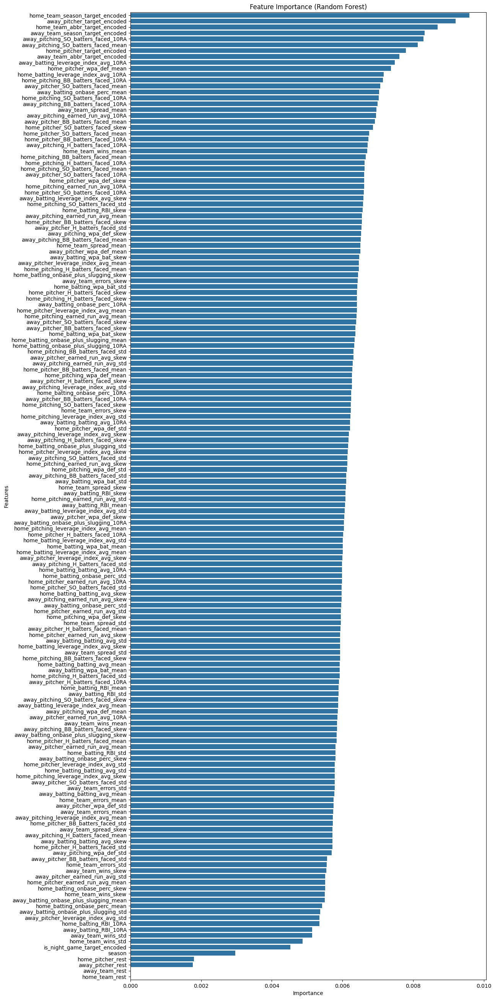

In [19]:
# Plot the feature importance (long plot)
plt.figure(figsize=(12, len(feature_importances) * 0.2))  # Adjust the height dynamically based on the number of features
sns.barplot(x='Importance', y='Feature', data=feature_importances)
plt.title("Feature Importance (Random Forest)")
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

In [20]:
# Step 2: Filter features based on importance (threshold adjustment)
threshold = 0.004  # Only keep features with importance greater than this

important_features = feature_importances[feature_importances['Importance'] > threshold]

# Get the list of important features
important_columns = important_features['Feature'].tolist()

# Keep only the important features in X
df_imp_features = X[important_columns]

# Append the target column 'home_team_win' (y) to df_imp_features
df_imp_features['home_team_win'] = y  # Append target column to the DataFrame

# Append the 'date' column from z
df_imp_features['date'] = z.values  # Re-add the 'date' column to the final DataFrame

# Check the first few rows to ensure it's added correctly
print(df_imp_features)

       home_team_season_target_encoded  away_pitcher_target_encoded  \
0                             0.583333                     0.437500   
1                             0.511111                     0.500000   
2                             0.590909                     0.428571   
3                             0.487179                     0.512821   
4                             0.644444                     0.400000   
...                                ...                          ...   
11062                         0.540541                     0.543478   
11063                         0.476190                     0.666667   
11064                         0.459459                     0.615385   
11065                         0.600000                     0.425532   
11066                         0.571429                     0.529412   

       home_team_abbr_target_encoded  away_team_season_target_encoded  \
0                           0.584459                         0.515152   
1

/var/folders/7k/7nscd_8950zcdl73vyv1vl8m0000gn/T/ipykernel_52776/2065989378.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imp_features['home_team_win'] = y  # Append target column to the DataFrame
/var/folders/7k/7nscd_8950zcdl73vyv1vl8m0000gn/T/ipykernel_52776/2065989378.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imp_features['date'] = z.values  # Re-add the 'date' column to the final DataFrame


In [21]:
non_imp_features = feature_importances[feature_importances['Importance'] < threshold]
non_imp_features

,Feature,Importance
4,season,0.002969
2,home_pitcher_rest,0.001802
3,away_pitcher_rest,0.001767
1,away_team_rest,0.000000
0,home_team_rest,0.000000


In [22]:
test_data_imp_features = test_data_encoded.drop(columns = ['season', 'home_pitcher_rest', 'away_pitcher_rest', 'away_team_rest', 'home_team_rest'])

In [23]:
test_data_imp_features

,id,home_batting_batting_avg_10RA,home_batting_onbase_perc_10RA,home_batting_onbase_plus_slugging_10RA,home_batting_leverage_index_avg_10RA,home_batting_RBI_10RA,away_batting_batting_avg_10RA,away_batting_onbase_perc_10RA,away_batting_onbase_plus_slugging_10RA,away_batting_leverage_index_avg_10RA,...,away_pitcher_wpa_def_mean,away_pitcher_wpa_def_std,away_pitcher_wpa_def_skew,home_team_abbr_target_encoded,away_team_abbr_target_encoded,is_night_game_target_encoded,home_pitcher_target_encoded,away_pitcher_target_encoded,home_team_season_target_encoded,away_team_season_target_encoded
0,0,0.815178,-0.139214,0.860108,-0.685997,0.592584,0.423601,0.720581,1.307045,0.716285,...,0.710790,-0.305795,-1.103229,0.609428,0.534014,0.541571,0.648649,0.583333,0.595238,0.611111
1,1,-0.819056,-1.043317,-0.501758,0.266741,-0.827492,0.099930,0.548661,0.850646,-1.895540,...,-0.129330,0.467740,0.873353,0.519608,0.577049,0.526013,0.411765,0.578947,0.575000,0.525000
2,2,0.566940,0.133967,1.167550,-0.119877,0.681339,0.974529,0.720581,NaN,-0.582754,...,-0.486104,0.380234,0.944937,0.515358,0.533557,0.526013,0.500000,0.285714,0.425000,0.531038
3,3,0.842760,NaN,0.494216,0.384107,-0.028699,0.213559,-0.388785,-0.707848,NaN,...,-0.583598,0.654581,NaN,0.470199,0.602007,0.541571,0.250000,0.580645,0.275000,0.642857
4,4,1.849503,1.038070,0.939598,0.722399,0.326320,0.520013,0.412424,0.027269,0.888116,...,-0.262628,0.444447,-0.113465,0.532203,0.500000,0.541571,0.531038,0.576923,0.275000,0.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6180,6180,0.329045,-0.334344,-0.410577,0.252933,-0.827492,-1.563185,-2.250703,-2.327891,2.022198,...,-0.515166,-1.832176,-2.189157,0.491468,0.617747,0.526013,0.333333,0.625000,0.371429,0.702703
6181,6181,0.225612,0.576262,-0.217695,0.867381,-0.028699,0.265209,0.470811,1.287303,-1.008894,...,-0.849379,-1.228204,0.145295,0.590909,0.533557,0.541571,0.694444,0.666667,0.743590,0.531038
6182,6182,-0.367401,-0.669318,-0.354466,0.356492,0.148810,NaN,-0.012509,0.021462,-0.967655,...,0.444184,0.262688,0.417515,0.519608,0.577049,0.526013,1.000000,0.437500,0.567568,0.605263
6183,6183,1.487489,1.691755,1.822181,-1.680159,1.213868,0.003518,0.269698,-0.001764,-0.012276,...,0.690523,0.815152,-0.113742,0.560976,0.460526,0.541571,0.627907,0.414634,0.648649,0.500000


In [24]:
valid_data = df_imp_features[(df_imp_features['date'] >= '2016-08-01') & (df_imp_features['date'] <= '2023-12-31')]
valid_data

,home_team_season_target_encoded,away_pitcher_target_encoded,home_team_abbr_target_encoded,away_team_season_target_encoded,away_pitching_SO_batters_faced_10RA,away_pitching_SO_batters_faced_mean,home_pitcher_target_encoded,away_team_abbr_target_encoded,away_batting_leverage_index_avg_10RA,home_pitcher_wpa_def_mean,...,home_batting_onbase_perc_mean,away_batting_onbase_plus_slugging_std,away_pitcher_leverage_index_avg_std,home_batting_RBI_10RA,away_batting_RBI_10RA,away_team_wins_std,home_team_wins_std,is_night_game_target_encoded,home_team_win,date
0,0.583333,0.437500,0.584459,0.515152,-0.202339,1.888298,0.200000,0.501706,0.758998,2.553281e-01,...,-7.130529e-01,-1.098834,-0.905814,-0.117039,-0.298588,0.593786,0.762420,0.546199,True,2021-05-16
1,0.511111,0.500000,0.519608,0.435897,0.967920,1.465869,0.642857,0.405844,0.350305,-7.240290e-01,...,3.468898e-01,1.005468,-1.421868,0.915488,-0.117117,0.557479,0.792572,0.526013,False,2019-05-04
2,0.590909,0.428571,0.518152,0.461538,0.876726,0.546798,0.764706,0.432343,-0.388208,6.640598e-01,...,1.032527e+00,0.589615,0.119774,1.103220,-0.207853,-1.891295,0.797426,0.529980,True,2019-06-10
3,0.487179,0.512821,0.535836,0.525000,0.702263,0.761290,0.480000,0.496753,-2.768661,-1.924164e-02,...,-1.491010e-01,0.605287,0.147261,-0.398637,1.243913,0.597431,0.786111,0.518926,True,2018-06-26
6,0.485714,0.461538,0.500000,0.589744,0.712561,0.306741,0.676471,0.546075,1.232220,6.059730e-01,...,-5.975986e-01,2.428653,-1.639782,-1.055700,0.336560,0.836132,0.034182,0.529980,False,2019-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11061,0.700000,1.000000,0.617747,0.700000,0.238849,-0.551011,0.709091,0.606061,-0.230468,3.945368e-01,...,3.651190e-18,-0.813263,0.874410,-0.492503,-1.205942,-0.076533,-2.298143,0.520209,True,2022-06-03
11063,0.476190,0.666667,0.540816,0.605263,-0.244980,-0.412166,0.583333,0.584775,-0.230468,-2.318982e+00,...,-2.975673e-01,0.650979,-1.588787,-0.492503,-0.207853,-0.135784,-2.298143,0.543307,False,2023-04-19
11064,0.459459,0.615385,0.461794,0.567568,-1.644296,-0.158688,0.272727,0.514754,-0.639160,-8.919188e-01,...,3.651190e-18,0.458885,0.392938,0.164559,1.425384,0.600295,-1.971184,0.526013,True,2022-05-27
11065,0.600000,0.425532,0.493243,0.421053,0.712530,0.534465,0.375000,0.410596,0.235585,-1.733709e-18,...,-2.897913e-01,0.388853,-0.300227,-0.492503,1.243913,0.459981,-0.046645,0.518926,False,2021-05-19


In [25]:
# Split the training data (January to July, 2016–2023)
train_data = df_imp_features[df_imp_features['date'] <= '2023-07-31']

# Separate features and target
X_train = train_data.drop(['home_team_win', 'date'], axis=1)
y_train = train_data['home_team_win']


In [26]:
X_test = test_data_imp_features.drop(['id'], axis=1)
X_test

,home_batting_batting_avg_10RA,home_batting_onbase_perc_10RA,home_batting_onbase_plus_slugging_10RA,home_batting_leverage_index_avg_10RA,home_batting_RBI_10RA,away_batting_batting_avg_10RA,away_batting_onbase_perc_10RA,away_batting_onbase_plus_slugging_10RA,away_batting_leverage_index_avg_10RA,away_batting_RBI_10RA,...,away_pitcher_wpa_def_mean,away_pitcher_wpa_def_std,away_pitcher_wpa_def_skew,home_team_abbr_target_encoded,away_team_abbr_target_encoded,is_night_game_target_encoded,home_pitcher_target_encoded,away_pitcher_target_encoded,home_team_season_target_encoded,away_team_season_target_encoded
0,0.815178,-0.139214,0.860108,-0.685997,0.592584,0.423601,0.720581,1.307045,0.716285,1.213491,...,0.710790,-0.305795,-1.103229,0.609428,0.534014,0.541571,0.648649,0.583333,0.595238,0.611111
1,-0.819056,-1.043317,-0.501758,0.266741,-0.827492,0.099930,0.548661,0.850646,-1.895540,1.213491,...,-0.129330,0.467740,0.873353,0.519608,0.577049,0.526013,0.411765,0.578947,0.575000,0.525000
2,0.566940,0.133967,1.167550,-0.119877,0.681339,0.974529,0.720581,NaN,-0.582754,NaN,...,-0.486104,0.380234,0.944937,0.515358,0.533557,0.526013,0.500000,0.285714,0.425000,0.531038
3,0.842760,NaN,0.494216,0.384107,-0.028699,0.213559,-0.388785,-0.707848,NaN,-0.470396,...,-0.583598,0.654581,NaN,0.470199,0.602007,0.541571,0.250000,0.580645,0.275000,0.642857
4,1.849503,1.038070,0.939598,0.722399,0.326320,0.520013,0.412424,0.027269,0.888116,-0.027268,...,-0.262628,0.444447,-0.113465,0.532203,0.500000,0.541571,0.531038,0.576923,0.275000,0.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6180,0.329045,-0.334344,-0.410577,0.252933,-0.827492,-1.563185,-2.250703,-2.327891,2.022198,-1.268026,...,-0.515166,-1.832176,-2.189157,0.491468,0.617747,0.526013,0.333333,0.625000,0.371429,0.702703
6181,0.225612,0.576262,-0.217695,0.867381,-0.028699,0.265209,0.470811,1.287303,-1.008894,NaN,...,-0.849379,-1.228204,0.145295,0.590909,0.533557,0.541571,0.694444,0.666667,0.743590,0.531038
6182,-0.367401,-0.669318,-0.354466,0.356492,0.148810,NaN,-0.012509,0.021462,-0.967655,0.770363,...,0.444184,0.262688,0.417515,0.519608,0.577049,0.526013,1.000000,0.437500,0.567568,0.605263
6183,1.487489,1.691755,1.822181,-1.680159,1.213868,0.003518,0.269698,-0.001764,-0.012276,0.149983,...,0.690523,0.815152,-0.113742,0.560976,0.460526,0.541571,0.627907,0.414634,0.648649,0.500000


In [27]:
X_train

,home_team_season_target_encoded,away_pitcher_target_encoded,home_team_abbr_target_encoded,away_team_season_target_encoded,away_pitching_SO_batters_faced_10RA,away_pitching_SO_batters_faced_mean,home_pitcher_target_encoded,away_team_abbr_target_encoded,away_batting_leverage_index_avg_10RA,home_pitcher_wpa_def_mean,...,home_team_wins_skew,away_batting_onbase_plus_slugging_mean,home_batting_onbase_perc_mean,away_batting_onbase_plus_slugging_std,away_pitcher_leverage_index_avg_std,home_batting_RBI_10RA,away_batting_RBI_10RA,away_team_wins_std,home_team_wins_std,is_night_game_target_encoded
0,0.583333,0.437500,0.584459,0.515152,-2.023388e-01,1.888298,0.200000,0.501706,0.758998,2.553281e-01,...,-0.354271,-0.655471,-7.130529e-01,-1.098834,-0.905814,-1.170390e-01,-0.298588,0.593786,0.762420,0.546199
1,0.511111,0.500000,0.519608,0.435897,9.679197e-01,1.465869,0.642857,0.405844,0.350305,-7.240290e-01,...,0.276169,1.476021,3.468898e-01,1.005468,-1.421868,9.154881e-01,-0.117117,0.557479,0.792572,0.526013
2,0.590909,0.428571,0.518152,0.461538,8.767265e-01,0.546798,0.764706,0.432343,-0.388208,6.640598e-01,...,0.267339,1.642414,1.032527e+00,0.589615,0.119774,1.103220e+00,-0.207853,-1.891295,0.797426,0.529980
3,0.487179,0.512821,0.535836,0.525000,7.022625e-01,0.761290,0.480000,0.496753,-2.768661,-1.924164e-02,...,-0.315816,0.843640,-1.491010e-01,0.605287,0.147261,-3.986373e-01,1.243913,0.597431,0.786111,0.518926
4,0.644444,0.400000,0.590909,0.489362,-5.385775e-18,-1.960937,0.617647,0.577049,-0.574629,-3.228218e-01,...,-0.468599,0.656882,2.243396e+00,-0.041228,-0.208172,4.586563e-18,1.153178,-0.287449,0.675569,0.526013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11062,0.540541,0.543478,0.500000,0.512821,-6.795797e-01,0.534405,0.578947,0.540268,-0.008196,-9.279889e-01,...,-0.121986,1.034234,1.032986e+00,0.923392,0.520163,2.584254e-01,0.155089,-0.147857,0.862579,0.529980
11063,0.476190,0.666667,0.540816,0.605263,-2.449803e-01,-0.412166,0.583333,0.584775,-0.230468,-2.318982e+00,...,2.285925,0.534847,-2.975673e-01,0.650979,-1.588787,-4.925034e-01,-0.207853,-0.135784,-2.298143,0.543307
11064,0.459459,0.615385,0.461794,0.567568,-1.644296e+00,-0.158688,0.272727,0.514754,-0.639160,-8.919188e-01,...,1.795540,0.253301,3.651190e-18,0.458885,0.392938,1.645593e-01,1.425384,0.600295,-1.971184,0.526013
11065,0.600000,0.425532,0.493243,0.421053,7.125305e-01,0.534465,0.375000,0.410596,0.235585,-1.733709e-18,...,-1.006435,0.814697,-2.897913e-01,0.388853,-0.300227,-4.925034e-01,1.243913,0.459981,-0.046645,0.518926


In [60]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize and train the model
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [28]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialize the XGBoost model
xgb_model = XGBClassifier(random_state=42, eval_metric='mlogloss')

# Train the model on the training data
xgb_model.fit(X_train, y_train)

# Predict on the test data
y_test_pred_xgb = xgb_model.predict(X_test)

XGBoostError: 
XGBoost Library (libxgboost.dylib) could not be loaded.
Likely causes:
  * OpenMP runtime is not installed
    - vcomp140.dll or libgomp-1.dll for Windows
    - libomp.dylib for Mac OSX
    - libgomp.so for Linux and other UNIX-like OSes
    Mac OSX users: Run `brew install libomp` to install OpenMP runtime.

  * You are running 32-bit Python on a 64-bit OS

Error message(s): ["dlopen(/Users/ecpk/Library/Python/3.9/lib/python/site-packages/xgboost/lib/libxgboost.dylib, 0x0006): Library not loaded: '@rpath/libomp.dylib'\n  Referenced from: '/Users/ecpk/Library/Python/3.9/lib/python/site-packages/xgboost/lib/libxgboost.dylib'\n  Reason: tried: '/usr/local/opt/libomp/lib/libomp.dylib' (no such file), '/usr/local/opt/libomp/lib/libomp.dylib' (no such file), '/usr/local/lib/libomp.dylib' (no such file), '/usr/lib/libomp.dylib' (no such file)"]


In [70]:
# Align columns of X_test with X_train
X_test = X_test[X_train.columns]

# Now the feature names and order should match
print("X_test columns aligned with X_train:")
print(X_test.columns)

X_test columns aligned with X_train:
Index(['home_team_season_target_encoded', 'away_pitcher_target_encoded',
       'home_team_abbr_target_encoded', 'away_team_season_target_encoded',
       'away_pitching_SO_batters_faced_10RA',
       'away_pitching_SO_batters_faced_mean', 'home_pitcher_target_encoded',
       'away_team_abbr_target_encoded', 'away_batting_leverage_index_avg_10RA',
       'home_pitcher_wpa_def_mean',
       ...
       'home_team_wins_skew', 'away_batting_onbase_plus_slugging_mean',
       'home_batting_onbase_perc_mean',
       'away_batting_onbase_plus_slugging_std',
       'away_pitcher_leverage_index_avg_std', 'home_batting_RBI_10RA',
       'away_batting_RBI_10RA', 'away_team_wins_std', 'home_team_wins_std',
       'is_night_game_target_encoded'],
      dtype='object', length=159)


In [72]:
# Ensure the test data has all the columns in the training data
missing_columns = set(X_train.columns) - set(X_test.columns)
for col in missing_columns:
    X_test[col] = 0  # Assign a default value (e.g., 0)

# Drop any extra columns in X_test not present in X_train
X_test = X_test[X_train.columns]

In [74]:
print("Missing values in test data:")
print(X_test.isnull().sum())

Missing values in test data:
home_team_season_target_encoded          0
away_pitcher_target_encoded              0
home_team_abbr_target_encoded            0
away_team_season_target_encoded          0
away_pitching_SO_batters_faced_10RA    309
                                      ... 
home_batting_RBI_10RA                  309
away_batting_RBI_10RA                  309
away_team_wins_std                     309
home_team_wins_std                     309
is_night_game_target_encoded             0
Length: 159, dtype: int64


In [75]:
from sklearn.impute import SimpleImputer

# Imputer for numerical columns
imputer = SimpleImputer(strategy='mean')  # Change to 'median' or 'most_frequent' as needed
X_test = pd.DataFrame(imputer.fit_transform(X_test), columns=X_test.columns)

In [76]:
# Confirm no missing values remain
print("Missing values after handling:")
print(X_test.isnull().sum().sum())  # Should be 0


Missing values after handling:
0


In [77]:
y_test_pred = gb_model.predict(X_test)

In [80]:
submission = pd.DataFrame({
    'id': test_data['id'],       # Test data IDs
    'home_team_win': y_test_pred  # Predictions
})

In [81]:
submission

,id,home_team_win
0,0,True
1,1,False
2,2,True
3,3,True
4,4,False
...,...,...
6180,6180,True
6181,6181,True
6182,6182,True
6183,6183,False


In [82]:
submission.to_csv('submission2_stage1.csv', index=False)

print("Submission file 'submission_stage1.csv' created successfully!")

Submission file 'submission_stage1.csv' created successfully!


In [79]:
from sklearn.metrics import accuracy_score, classification_report

# Calculate accuracy
accuracy = accuracy_score(y_, y_test_pred)
print("Test Accuracy:", accuracy)

# Generate a detailed classification report
report = classification_report(y_train, y_test_pred)
print("\nClassification Report:\n", report)


ValueError: Found input variables with inconsistent numbers of samples: [11067, 6185]

In [68]:
df_imp_features

,home_team_season_target_encoded,away_pitcher_target_encoded,home_team_abbr_target_encoded,away_team_season_target_encoded,away_pitching_SO_batters_faced_10RA,away_pitching_SO_batters_faced_mean,home_pitcher_target_encoded,away_team_abbr_target_encoded,away_batting_leverage_index_avg_10RA,home_pitcher_wpa_def_mean,...,home_batting_onbase_perc_mean,away_batting_onbase_plus_slugging_std,away_pitcher_leverage_index_avg_std,home_batting_RBI_10RA,away_batting_RBI_10RA,away_team_wins_std,home_team_wins_std,is_night_game_target_encoded,home_team_win,date
0,0.583333,0.437500,0.584459,0.515152,-2.023388e-01,1.888298e+00,0.200000,0.501706,0.758998,2.553281e-01,...,-7.130529e-01,-1.098834,-0.905814,-1.170390e-01,-0.298588,0.593786,0.762420,0.546199,True,2021-05-16
1,0.511111,0.500000,0.519608,0.435897,9.679197e-01,1.465869e+00,0.642857,0.405844,0.350305,-7.240290e-01,...,3.468898e-01,1.005468,-1.421868,9.154881e-01,-0.117117,0.557479,0.792572,0.526013,False,2019-05-04
2,0.590909,0.428571,0.518152,0.461538,8.767265e-01,5.467984e-01,0.764706,0.432343,-0.388208,6.640598e-01,...,1.032527e+00,0.589615,0.119774,1.103220e+00,-0.207853,-1.891295,0.797426,0.529980,True,2019-06-10
3,0.487179,0.512821,0.535836,0.525000,7.022625e-01,7.612902e-01,0.480000,0.496753,-2.768661,-1.924164e-02,...,-1.491010e-01,0.605287,0.147261,-3.986373e-01,1.243913,0.597431,0.786111,0.518926,True,2018-06-26
4,0.644444,0.400000,0.590909,0.489362,-1.533551e-18,-1.960937e+00,0.617647,0.577049,-0.574629,-3.228218e-01,...,2.243396e+00,-0.041228,-0.208172,9.722862e-18,1.153178,-0.287449,0.675569,0.526013,False,2016-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11062,0.540541,0.543478,0.500000,0.512821,-6.795797e-01,5.344052e-01,0.578947,0.540268,-0.008196,-9.279889e-01,...,1.032986e+00,0.923392,0.520163,2.584254e-01,0.155089,-0.147857,0.862579,0.529980,True,2016-07-08
11063,0.476190,0.666667,0.540816,0.605263,-2.449803e-01,-4.121662e-01,0.583333,0.584775,-0.230468,-2.318982e+00,...,-2.975673e-01,0.650979,-1.588787,-4.925034e-01,-0.207853,-0.135784,-2.298143,0.543307,False,2023-04-19
11064,0.459459,0.615385,0.461794,0.567568,-1.644296e+00,-1.586876e-01,0.272727,0.514754,-0.639160,-8.919188e-01,...,-5.658352e-18,0.458885,0.392938,1.645593e-01,1.425384,0.600295,-1.971184,0.526013,True,2022-05-27
11065,0.600000,0.425532,0.493243,0.421053,7.125305e-01,5.344647e-01,0.375000,0.410596,0.235585,1.431722e-17,...,-2.897913e-01,0.388853,-0.300227,-4.925034e-01,1.243913,0.459981,-0.046645,0.518926,False,2021-05-19


In [69]:
test_data_imp_features

,id,home_batting_batting_avg_10RA,home_batting_onbase_perc_10RA,home_batting_onbase_plus_slugging_10RA,home_batting_leverage_index_avg_10RA,home_batting_RBI_10RA,away_batting_batting_avg_10RA,away_batting_onbase_perc_10RA,away_batting_onbase_plus_slugging_10RA,away_batting_leverage_index_avg_10RA,...,away_pitcher_wpa_def_mean,away_pitcher_wpa_def_std,away_pitcher_wpa_def_skew,home_team_abbr_target_encoded,away_team_abbr_target_encoded,is_night_game_target_encoded,home_pitcher_target_encoded,away_pitcher_target_encoded,home_team_season_target_encoded,away_team_season_target_encoded
0,0,0.815178,-0.139214,0.860108,-0.685997,0.592584,0.423601,0.720581,1.307045,0.716285,...,0.710790,-0.305795,-1.103229,0.609428,0.534014,0.541571,0.648649,0.583333,0.595238,0.611111
1,1,-0.819056,-1.043317,-0.501758,0.266741,-0.827492,0.099930,0.548661,0.850646,-1.895540,...,-0.129330,0.467740,0.873353,0.519608,0.577049,0.526013,0.411765,0.578947,0.575000,0.525000
2,2,0.566940,0.133967,1.167550,-0.119877,0.681339,0.974529,0.720581,NaN,-0.582754,...,-0.486104,0.380234,0.944937,0.515358,0.533557,0.526013,0.500000,0.285714,0.425000,0.531038
3,3,0.842760,NaN,0.494216,0.384107,-0.028699,0.213559,-0.388785,-0.707848,NaN,...,-0.583598,0.654581,NaN,0.470199,0.602007,0.541571,0.250000,0.580645,0.275000,0.642857
4,4,1.849503,1.038070,0.939598,0.722399,0.326320,0.520013,0.412424,0.027269,0.888116,...,-0.262628,0.444447,-0.113465,0.532203,0.500000,0.541571,0.531038,0.576923,0.275000,0.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6180,6180,0.329045,-0.334344,-0.410577,0.252933,-0.827492,-1.563185,-2.250703,-2.327891,2.022198,...,-0.515166,-1.832176,-2.189157,0.491468,0.617747,0.526013,0.333333,0.625000,0.371429,0.702703
6181,6181,0.225612,0.576262,-0.217695,0.867381,-0.028699,0.265209,0.470811,1.287303,-1.008894,...,-0.849379,-1.228204,0.145295,0.590909,0.533557,0.541571,0.694444,0.666667,0.743590,0.531038
6182,6182,-0.367401,-0.669318,-0.354466,0.356492,0.148810,NaN,-0.012509,0.021462,-0.967655,...,0.444184,0.262688,0.417515,0.519608,0.577049,0.526013,1.000000,0.437500,0.567568,0.605263
6183,6183,1.487489,1.691755,1.822181,-1.680159,1.213868,0.003518,0.269698,-0.001764,-0.012276,...,0.690523,0.815152,-0.113742,0.560976,0.460526,0.541571,0.627907,0.414634,0.648649,0.500000


In [83]:
pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.
